# Project name: PY sales optimizer

# Step 3 - Experimentation 

In [3]:
from google.colab import drive
drive.mount('/content/drive')

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.metrics import silhouette_score
import statsmodels.api
import statsmodels.formula.api as smf
from scipy import stats
from scipy.spatial.distance import cdist
from yellowbrick.cluster import SilhouetteVisualizer


from sklearn.pipeline import make_pipeline

seed = 100

df=pd.read_csv('Pakistan Largest Ecommerce Dataset.csv')
#df=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Pakistan Largest Ecommerce Dataset.csv");

## 1. Preprocessing (based on Step1 & Step2)



In [5]:
#Create Lifetime
df['Working Date2'] = pd.to_datetime(df['Working Date'])
base = df['Working Date2'].max()
df['Date'] = df['Working Date2'].apply(lambda x: x.date())
df['Customer_Since_Date'] = df.groupby('Customer ID')['Date'].transform(min)
df['Lifetime'] = (base.date() - df['Customer_Since_Date']).astype('timedelta64[D]') + 1

#Drop na
df.dropna(axis=0,how='all',inplace=True)
df.dropna(axis=1,how='all',inplace=True)
df.dropna(axis=0,how='any',inplace=True, subset=['Customer ID'])

# Further feature engeneering
df["BI Status"]=df["BI Status"].replace(to_replace=['#REF!'],value=["Net"])
df['BIstatus_num'] = df['BI Status']
df['BIstatus_num'] = df['BIstatus_num'].replace(['Net'], 1)
df['BIstatus_num'] = df['BIstatus_num'].replace(['Valid'], 0)
df['BIstatus_num'] = df['BIstatus_num'].replace(['Gross'], -1)

df['status_new'] = df['status']
df['status_new'] = df['status_new'].replace(['order_refunded', 'refund'],'refunded')
df['status_new'] = df['status_new'].replace(['complete', 'closed'],'completed')
df['status_new'] = df['status_new'].replace(['paid','received','cod',"exchange"],'processing')
df['status_new'] = df['status_new'].replace(['holded','pending_paypal','payment_review'],'pending')

df['Customer Since new']=pd.to_datetime(df['Customer Since']).dt.strftime('%Y%m').astype('int')

#Further cleaning
df=df[df["price"]>0]
df=df[df["grand_total"]>0]

# Further feature engeneering
df['discount_rate'] = (df['discount_amount']/(df['grand_total'] + df['discount_amount']) * 100).round(2)

df['grand_item']=df['price']*df["qty_ordered"]*(1-df['discount_rate']/100)

df=df[df["category_name_1"]!='\\N']

df=df.drop(["sales_commission_code"],axis=1)

# Further feature engeneering
df['payment_method'].replace(['Easypay_MA','easypay_voucher'],'Easypay',inplace=True)
df['payment_method'].replace(['jazzwallet','jazzvoucher'],'Jazz',inplace=True)
df['payment_method'].replace(['customercredit','ublcreditcard'],'Credit',inplace=True)
df['payment_method'].replace(['internetbanking'],'bankalfalah',inplace=True)

df=df.dropna(axis=0,how="any")


## 2. RFM scores (according to Step2)

In [6]:
#Only focus on positive/"promissing" transactions 
df=df[(df["status_new"]=="completed")|(df["status_new"]=="processing")]

print("Z score = (x-mean)/standard deviation = 3, gives 99.7% of the data points lie between +/- standard deviation. We use this statistics concept to remove outliers!")

#Number of orders (for Frequency)
T1=df.groupby(["Customer ID"]).agg({"increment_id":"count"})
m1=T1["increment_id"].mean()
s1=T1["increment_id"].std()
A1=T1[T1["increment_id"]<=m1+3*s1]
a1=A1.index
lis=[]
for id in df["Customer ID"]:
  lis.append(id in a1)

df1=df.iloc[lis]


# price, qty_ordered, discount_rate (for Monetary)
zpmax=df["price"].mean()+3*df["price"].std()
zpmin=df["price"].mean()-3*df["price"].std()
data=df1[(df1["price"]>=zpmin) & (df1["price"]<=zpmax)]

zqmax=data["qty_ordered"].mean()+3*data["qty_ordered"].std()
zqmin=data["qty_ordered"].mean()-3*data["qty_ordered"].std()
data=data[(data["qty_ordered"]>=zqmin) & (data["qty_ordered"]<=zqmax)]

zdmax=data["discount_rate"].mean()+3*data["discount_rate"].std()
zdmin=data["discount_rate"].mean()-3*data["discount_rate"].std()
data=data[(data["discount_rate"]>=zdmin) & (data["discount_rate"]<=zdmax)]



Z score = (x-mean)/standard deviation = 3, gives 99.7% of the data points lie between +/- standard deviation. We use this statistics concept to remove outliers!


In [7]:
# Calculate RFM-scores:

# Recency: Days since last purchase

data['Working Date'] = pd.to_datetime(data['Working Date'])
base = data['Working Date'].max()
data['Date'] = data['Working Date'].apply(lambda x: x.date())
data['Most_Recent_Purchase'] = data.groupby('Customer ID')['Date'].transform(max)
data['Recency'] = (base.date() - data['Most_Recent_Purchase']).astype('timedelta64[D]')

# Frequency: Total number of purchases
data['Frequency'] = data.groupby('Customer ID')['increment_id'].transform('nunique')

# Monetary: Total amount spend
data['Monetary'] = data.groupby('Customer ID')['grand_item'].transform('sum')


## 3. RFM - Tabels

In [8]:
# Standard Frequency (Absolut)
RFM_abs= data[['Customer ID', 'Recency', 'Frequency', 'Monetary']].drop_duplicates()

# Standard Frequency (Scores)
RFM_score=RFM_abs.copy()
RFM_score["Recency"]=pd.qcut(RFM_score["Recency"],5,labels=[5,4,3,2,1])
RFM_score["Frequency"]=pd.cut(RFM_score["Frequency"],bins=[0,1,3,5,10,60],labels=[1,2,3,4,5])
RFM_score["Monetary"]=pd.qcut(RFM_score["Monetary"],5,labels=[1,2,3,4,5])

# Relative Frequency (Absolut)
data['Frequency_rel'] = data['Frequency'] / (data['Lifetime']) * 100
RFM_rel= data[['Customer ID', 'Recency', 'Frequency_rel', 'Monetary']].drop_duplicates()
RFM_rel.index = RFM_rel['Customer ID']
RFM_rel = RFM_rel.drop('Customer ID', axis=1)
Frequency_rel_mean = RFM_rel['Frequency_rel'].mean()
Frequency_rel_std = RFM_rel['Frequency_rel'].std()
RFM_rel = RFM_rel[RFM_rel["Frequency_rel"]<=Frequency_rel_mean+3*Frequency_rel_std]

# Relative Frequency (Scores)
RFM_rel_score=RFM_rel.copy()
RFM_rel_score["Recency"]=pd.qcut(RFM_rel_score["Recency"],5,labels=[5,4,3,2,1])
RFM_rel_score["Frequency_rel"]=pd.qcut(RFM_rel_score["Frequency_rel"],5,labels=[1,2,3,4,5])
RFM_rel_score["Monetary"]=pd.qcut(RFM_rel_score["Monetary"],5,labels=[1,2,3,4,5])
RFM_rel_score["RFM_Rel_Score"] = RFM_rel_score["Recency"].astype(str) + RFM_rel_score["Frequency_rel"].astype(str) + RFM_rel_score["Monetary"].astype(str)


## 4. Summary baseline Models (details see Step 2) 

### 4.1. Model 1: K-Means on RFM values

In [9]:
# Scale the data between 0 and 1
RFM=RFM_abs.copy().drop(["Customer ID"],axis=1)
scaler=preprocessing.MinMaxScaler().fit(RFM)
RFM=scaler.transform(RFM)
#best k choosen by ellbow-method and silhouette analysis (see step 2)
kmeans=KMeans(n_clusters=4, random_state = seed)
kmeans.fit(RFM)
# add now the predicted cluster to the RFM table
RFM_res = RFM_abs.copy()
RFM_res['Cluster1'] = kmeans.labels_

silhouette_score(RFM,kmeans.labels_,metric="sqeuclidean")

0.6743543307993832

### 4.2. Model 2: K-Means on RFM scores

In [10]:
# Scale the data between 0 and 1
RFM=RFM_score.copy().drop(["Customer ID"],axis=1)
scaler=preprocessing.MinMaxScaler().fit(RFM)
RFM=scaler.transform(RFM)
#best k choosen by ellbow-method and silhouette analysis (see step 2)
kmeans=KMeans(n_clusters=4, random_state=seed)
kmeans.fit(RFM)
# add now the predicted cluster to the RFM table
RFM_res = RFM_res.copy()
RFM_res['Cluster2'] = kmeans.labels_

silhouette_score(RFM,kmeans.labels_,metric="sqeuclidean")

0.5258373262429944

### 4.3. Model 3: K-Means on RFM relative frequency - no standardise data

In [11]:
# Fit best number of clusters (see step 2)
kmeans = KMeans(n_clusters = 4, random_state = seed)
pipeline = make_pipeline(kmeans)
pipeline.fit(RFM_rel)

predicts = pipeline.predict(RFM_rel)
RFM_rel_group = RFM_rel_score['RFM_Rel_Score']
outcome = pd.DataFrame({'predicts': predicts, 'RFM_rel_group': RFM_rel_group})
RFM_rel_pred3 = pd.crosstab(outcome['RFM_rel_group'], outcome['predicts'])
RFM_rel_pred3.columns = ['M3_0', 'M3_1', 'M3_2', 'M3_3']

# add now the predicted cluster to the RFM table
RFM_rel_res = RFM_rel.copy()
RFM_rel_res['Cluster3'] = kmeans.labels_

silhouette_score(RFM_rel,kmeans.labels_,metric="sqeuclidean")

0.9050030051089372

### 4.4. Model 4: K-Means on RFM relative frequency - standardise data

In [12]:
from sklearn.preprocessing import StandardScaler
scaler = preprocessing.StandardScaler()

# Fit best number of clusters (see step 2)
kmeans = KMeans(n_clusters = 4, random_state = seed)
pipeline = make_pipeline(scaler, kmeans)
pipeline.fit(RFM_rel)
predicts = pipeline.predict(RFM_rel)
RFM_rel_group = RFM_rel_score['RFM_Rel_Score']
outcome = pd.DataFrame({'predicts': predicts, 'RFM_rel_group': RFM_rel_group})
RFM_rel_pred4 = pd.crosstab(outcome['RFM_rel_group'], outcome['predicts'])
RFM_rel_pred4.columns = ['M4_0', 'M4_1', 'M4_2', 'M4_3']

RFM_rel_pred = pd.merge(RFM_rel_pred3, RFM_rel_pred4, on='RFM_rel_group')

# add now the predicted cluster to the RFM table
RFM_rel_res = RFM_rel_res.copy()
RFM_rel_res['Cluster4'] = kmeans.labels_

silhouette_score(RFM_rel,kmeans.labels_,metric="sqeuclidean")

-0.006573881863770184

### 4.5. Model 5: K-Means on RFM relative frequency - standardised - remove best group 555


In [13]:
RFM_rel_excl555 = RFM_rel[RFM_rel_score['RFM_Rel_Score'] != '555']

# Fit best number of clusters (see step 2)
kmeans = KMeans(n_clusters = 4, random_state = seed)
pipeline = make_pipeline(scaler, kmeans)
pipeline.fit(RFM_rel_excl555)
predicts = pipeline.predict(RFM_rel_excl555)
RFM_rel_group = RFM_rel_score['RFM_Rel_Score'][RFM_rel_score['RFM_Rel_Score'] != '555']
outcome = pd.DataFrame({'predicts': predicts, 'RFM_rel_group': RFM_rel_group})

RFM_rel_pred5 = pd.crosstab(outcome['RFM_rel_group'], outcome['predicts'])
RFM_rel_pred5.columns = ['M5_0', 'M5_1', 'M5_2', 'M5_3']
RFM_rel_pred = pd.merge(RFM_rel_pred, RFM_rel_pred5, on='RFM_rel_group')
# add now the predicted cluster to the RFM table
RFM_rel_res5 = RFM_rel_excl555.copy()
RFM_rel_res5['Cluster5'] = kmeans.labels_

silhouette_score(RFM_rel_excl555,kmeans.labels_,metric="sqeuclidean")

0.011792098235487833

## 5. Model result interpretation





In [14]:
# Result table on RFM Values, contains cluster 1 and cluster 2
RFM_res

,Customer ID,Recency,Frequency,Monetary,Cluster1,Cluster2
0,1.0,788.0,1,1950.0,0,0
7,6.0,788.0,1,170.0,0,1
10,9.0,788.0,1,5500.0,0,0
11,10.0,788.0,1,366.0,0,1
13,11.0,560.0,4,945.0,2,1
...,...,...,...,...,...,...
584488,110259.0,0.0,1,798.0,1,3
584496,115322.0,0.0,1,1048.0,1,3
584509,115324.0,0.0,1,399.0,1,3
584517,115325.0,0.0,2,899.0,1,3


Customers are now divided into 4 groups
Visualize now the clusters of first two models
start with recency analysis

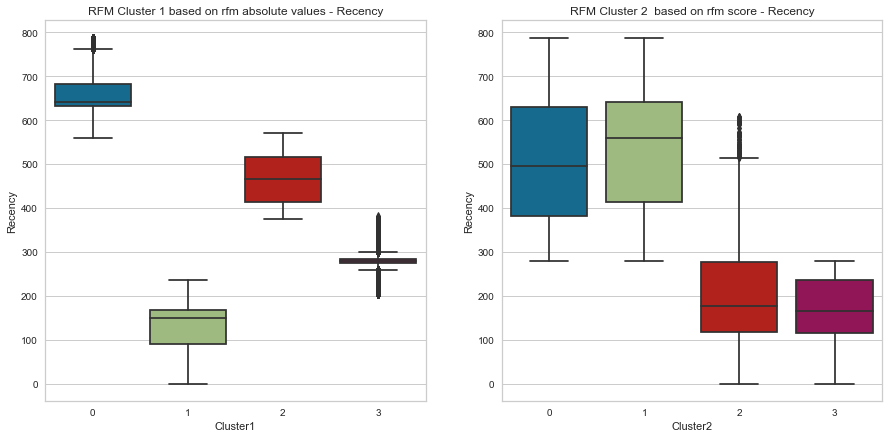

In [19]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
sns.boxplot(x = 'Cluster1', y='Recency', data=RFM_res)

plt.ylabel('Recency')
plt.title('RFM Cluster 1 based on rfm absolute values - Recency')

plt.subplot(1,2,2)
sns.boxplot(x = 'Cluster2', y='Recency', data=RFM_res)

plt.ylabel('Recency')
plt.title('RFM Cluster 2  based on rfm score - Recency')
plt.show()

Observation:
The higher the (Recency) value, the less often the shop was visited. 
In this case, group 0 in cluster 1 and group 0 & 1 in cluster 2 haven't visited the online shop for a long time.  
Group 1 in cluster1 and group 2 & 3 in cluster2 have visited the shop recently.


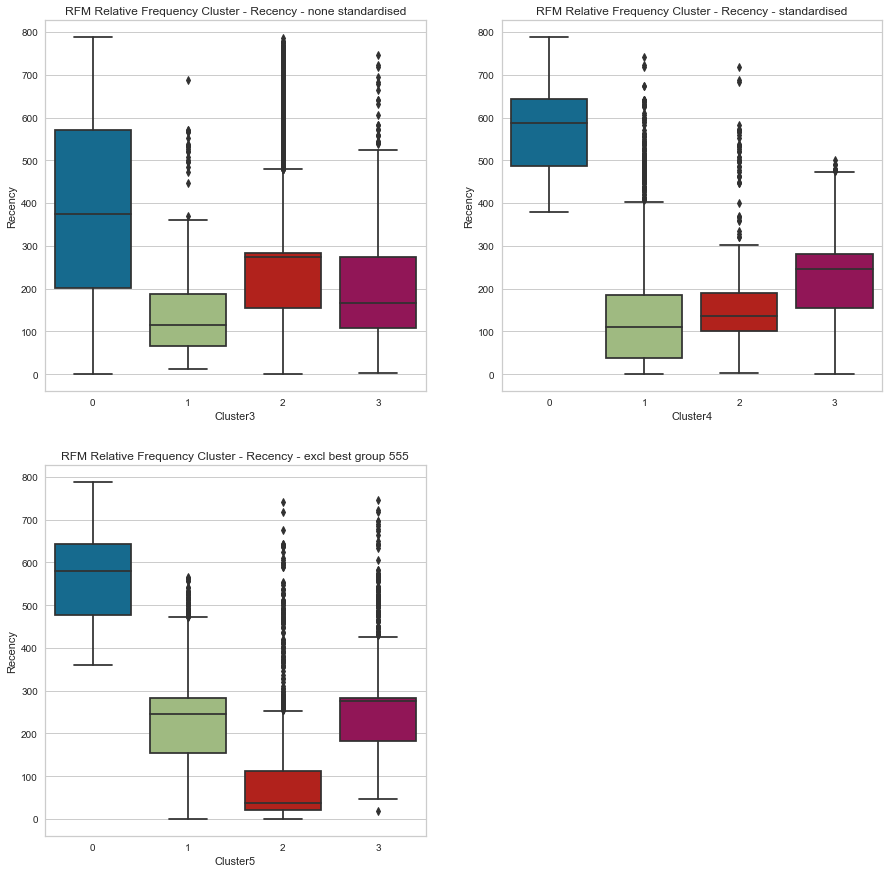

In [20]:
# use relative freequency model
plt.figure(figsize=(15,15))
plt.subplot(221)
sns.boxplot(x = 'Cluster3', y='Recency', data=RFM_rel_res)

plt.ylabel('Recency')
plt.title('RFM Relative Frequency Cluster - Recency - none standardised')

plt.subplot(222)
sns.boxplot(x = 'Cluster4', y='Recency', data=RFM_rel_res)

plt.ylabel('Recency')
plt.title('RFM Relative Frequency Cluster - Recency - standardised')

plt.subplot(223)
sns.boxplot(x = 'Cluster5', y='Recency', data=RFM_rel_res5)

plt.ylabel('Recency')
plt.title('RFM Relative Frequency Cluster - Recency - excl best group 555')
plt.show();

**Check in the next Step distribution of FREQUENCY**

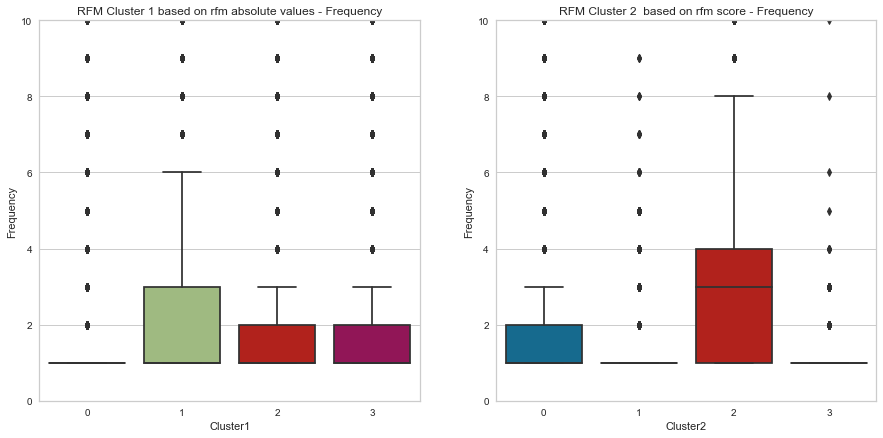

In [23]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
sns.boxplot(x = 'Cluster1', y='Frequency', data=RFM_res)

plt.ylabel('Frequency')
plt.title('RFM Cluster 1 based on rfm absolute values - Frequency')
plt.ylim(0,10)

plt.subplot(1,2,2)
sns.boxplot(x = 'Cluster2', y='Frequency', data=RFM_res)

plt.ylabel('Frequency')
plt.title('RFM Cluster 2  based on rfm score - Frequency')
plt.ylim(0,10)
plt.show()

Observation:

Model 1 on Absolute RFM -> group 1 contains the most frequent customers

Model 2 on frm score -> group 2 contains the most frequent customers

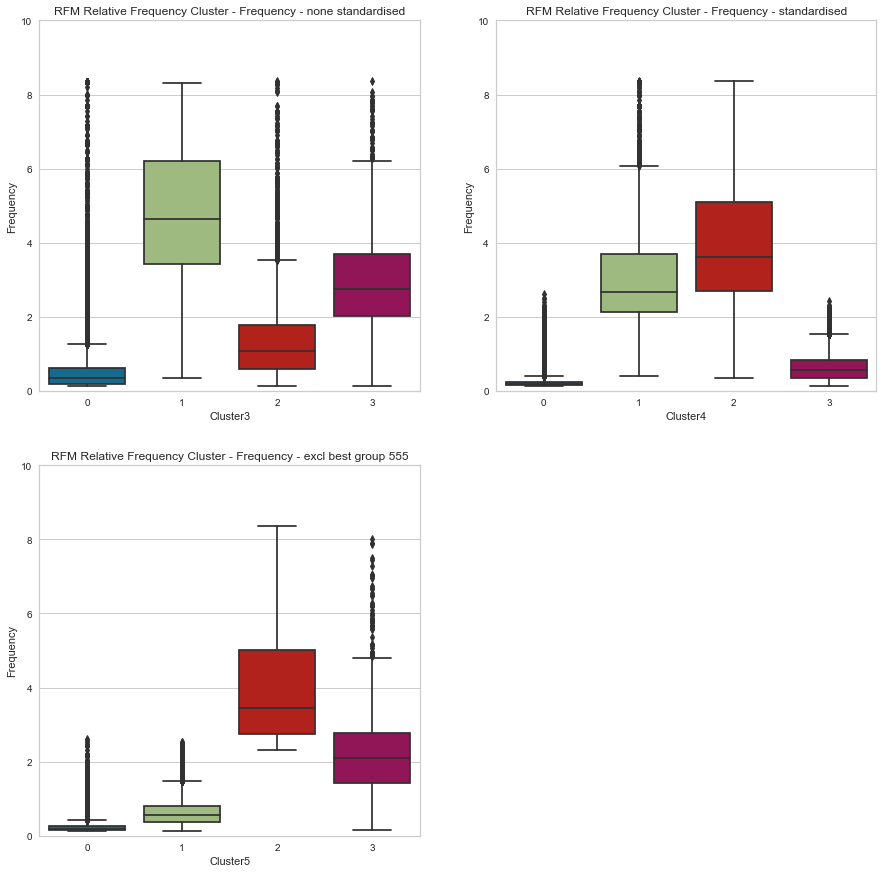

In [24]:
# use relative freequency model
plt.figure(figsize=(15,15))
plt.subplot(221)
sns.boxplot(x = 'Cluster3', y='Frequency_rel', data=RFM_rel_res)

plt.ylabel('Frequency')
plt.title('RFM Relative Frequency Cluster - Frequency - none standardised')
plt.ylim(0,10)

plt.subplot(222)
sns.boxplot(x = 'Cluster4', y='Frequency_rel', data=RFM_rel_res)

plt.ylabel('Frequency')
plt.title('RFM Relative Frequency Cluster - Frequency - standardised')
plt.ylim(0,10)

plt.subplot(223)
sns.boxplot(x = 'Cluster5', y='Frequency_rel', data=RFM_rel_res5)

plt.ylabel('Frequency')
plt.title('RFM Relative Frequency Cluster - Frequency - excl best group 555')
plt.ylim(0,10)
plt.show();

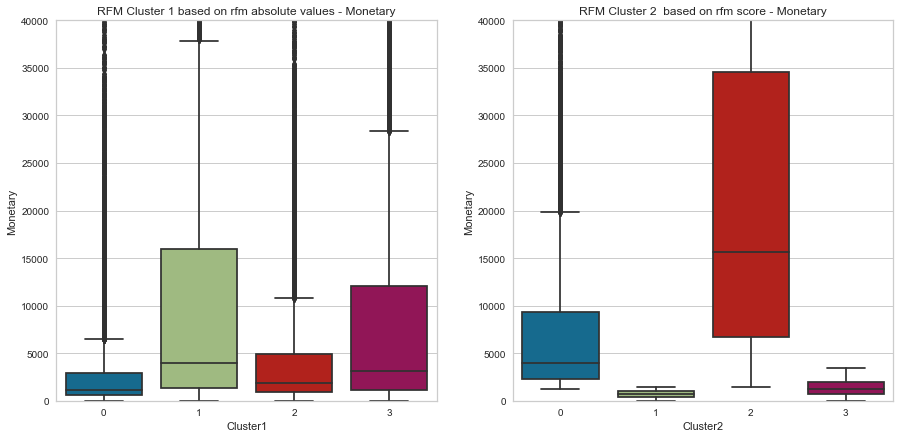

In [25]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
sns.boxplot(x = 'Cluster1', y='Monetary', data=RFM_res)

plt.ylabel('Monetary')
plt.title('RFM Cluster 1 based on rfm absolute values - Monetary')
plt.ylim(0,40000)

plt.subplot(1,2,2)
sns.boxplot(x = 'Cluster2', y='Monetary', data=RFM_res)

plt.ylabel('Monetary')
plt.title('RFM Cluster 2  based on rfm score - Monetary')
plt.ylim(0,40000)
plt.show()

**Observation: group 2 in cluster2 spent more money than the others**



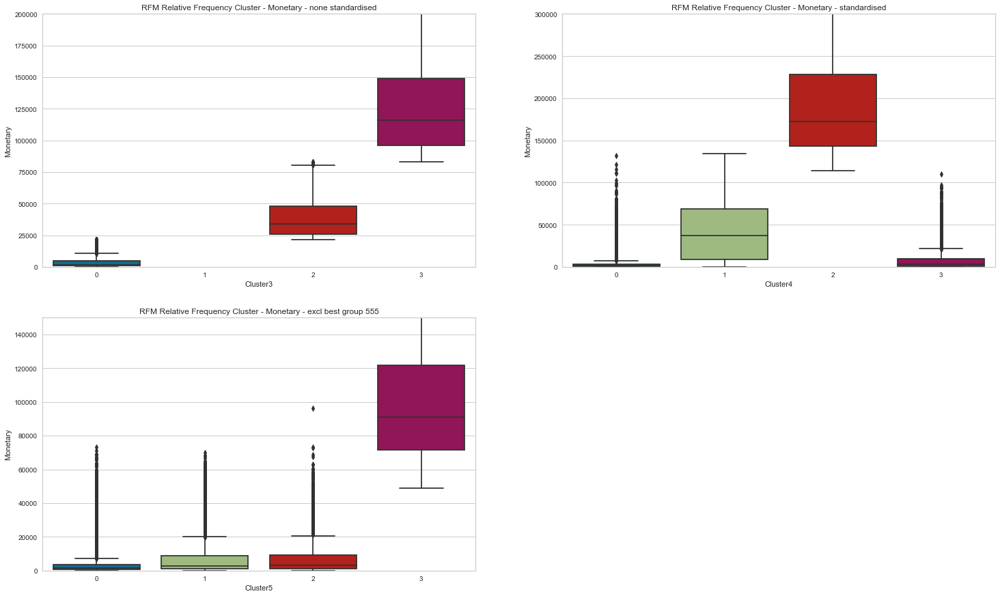

In [41]:
# use relative freequency model
plt.figure(figsize=(25,15))
plt.subplot(221)
sns.boxplot(x = 'Cluster3', y='Monetary', data=RFM_rel_res)
plt.ylim(0,200000)
plt.ylabel('Monetary')
plt.title('RFM Relative Frequency Cluster - Monetary - none standardised')

plt.subplot(222)
sns.boxplot(x = 'Cluster4', y='Monetary', data=RFM_rel_res)
plt.ylim(0,300000)
plt.ylabel('Monetary')
plt.title('RFM Relative Frequency Cluster - Monetary - standardised')

plt.subplot(223)
sns.boxplot(x = 'Cluster5', y='Monetary', data=RFM_rel_res5)
plt.ylim(0,150000)
plt.ylabel('Monetary')
plt.title('RFM Relative Frequency Cluster - Monetary - excl best group 555')
plt.show();

**Compare now two variables (RM) and visualize them to show the created clusters**

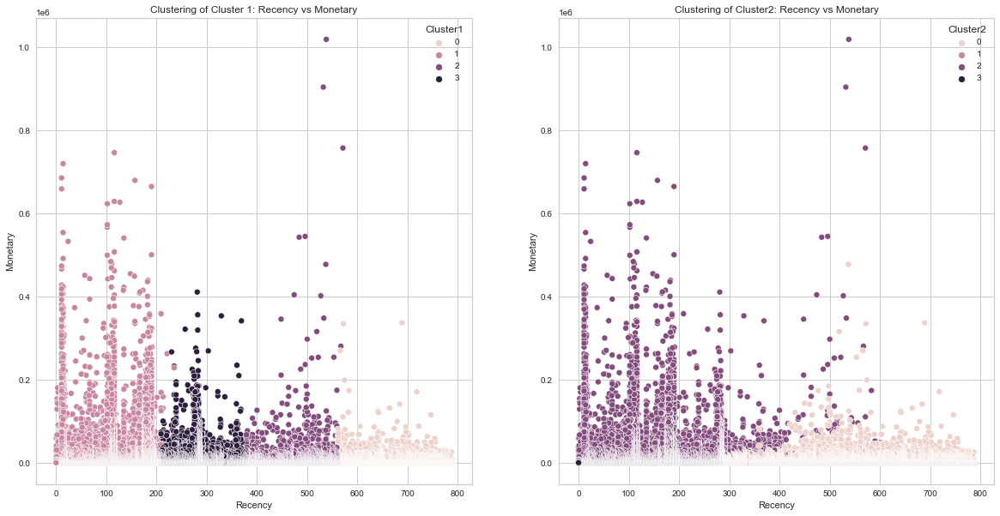

In [27]:
#Model 1 and 2

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)

sns.scatterplot(RFM_res['Recency'], RFM_res['Monetary'], hue=RFM_res['Cluster1'])
plt.title('Clustering of Cluster 1: Recency vs Monetary')


plt.subplot(1,2,2)
sns.scatterplot(RFM_res['Recency'], RFM_res['Monetary'], hue=RFM_res['Cluster2'])
plt.title('Clustering of Cluster2: Recency vs Monetary')

plt.show()

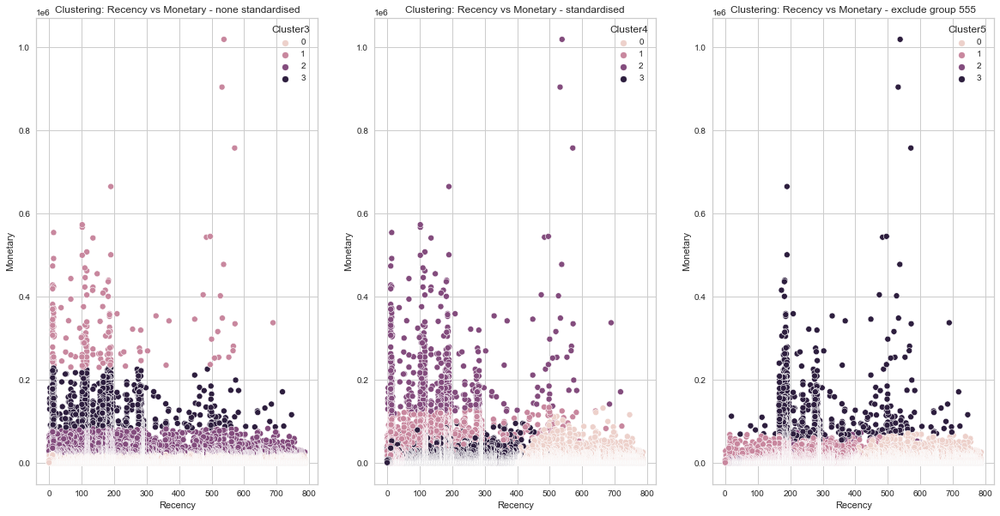

In [28]:
# model 3 & model 4 & model 5
plt.figure(figsize=(20,10))
plt.subplot(131)
sns.scatterplot(RFM_rel_res['Recency'], RFM_rel_res['Monetary'], hue=RFM_rel_res['Cluster3'])
plt.title('Clustering: Recency vs Monetary - none standardised')

plt.subplot(132)
sns.scatterplot(RFM_rel_res['Recency'], RFM_rel_res['Monetary'], hue=RFM_rel_res['Cluster4'])
plt.title('Clustering: Recency vs Monetary - standardised')

plt.subplot(133)
sns.scatterplot(RFM_rel_res5['Recency'], RFM_rel_res5['Monetary'], hue=RFM_rel_res5['Cluster5'])
plt.title('Clustering: Recency vs Monetary - exclude group 555')
plt.show()

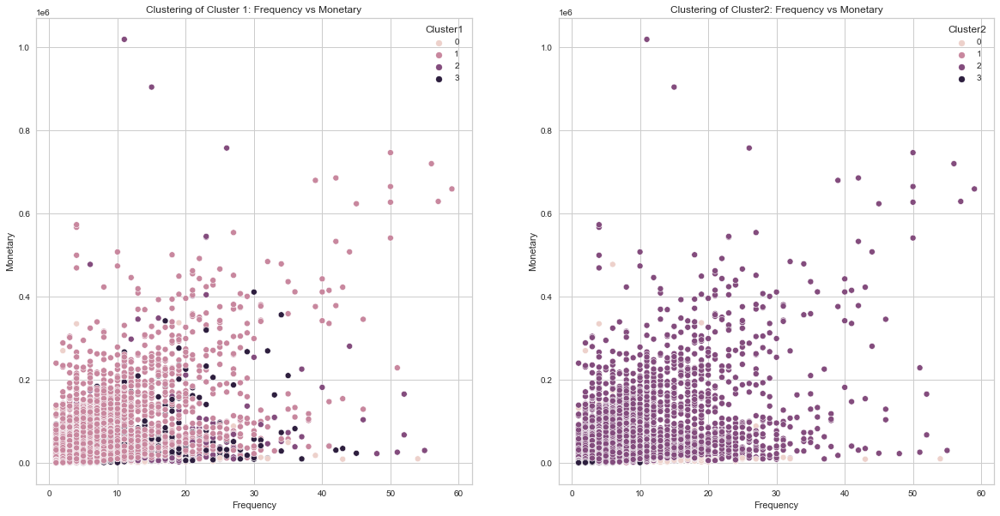

In [29]:
#Model 1 and 2

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)

sns.scatterplot(RFM_res['Frequency'], RFM_res['Monetary'], hue=RFM_res['Cluster1'])
plt.title('Clustering of Cluster 1: Frequency vs Monetary')


plt.subplot(1,2,2)
sns.scatterplot(RFM_res['Frequency'], RFM_res['Monetary'], hue=RFM_res['Cluster2'])
plt.title('Clustering of Cluster2: Frequency vs Monetary')

plt.show()


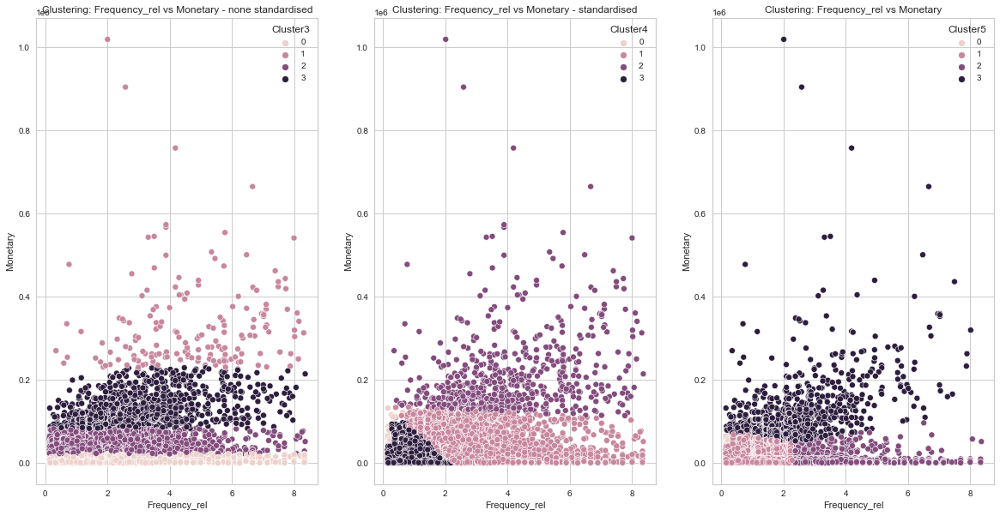

In [30]:
# model 3 & model 4 & model 5
plt.figure(figsize=(20,10))
plt.subplot(131)
sns.scatterplot(RFM_rel_res['Frequency_rel'], RFM_rel_res['Monetary'], hue=RFM_rel_res['Cluster3'])
plt.title('Clustering: Frequency_rel vs Monetary - none standardised')

plt.subplot(132)
sns.scatterplot(RFM_rel_res['Frequency_rel'], RFM_rel_res['Monetary'], hue=RFM_rel_res['Cluster4'])
plt.title('Clustering: Frequency_rel vs Monetary - standardised')

plt.subplot(133)
sns.scatterplot(RFM_rel_res5['Frequency_rel'], RFM_rel_res5['Monetary'], hue=RFM_rel_res5['Cluster5'])
plt.title('Clustering: Frequency_rel vs Monetary')
plt.show()

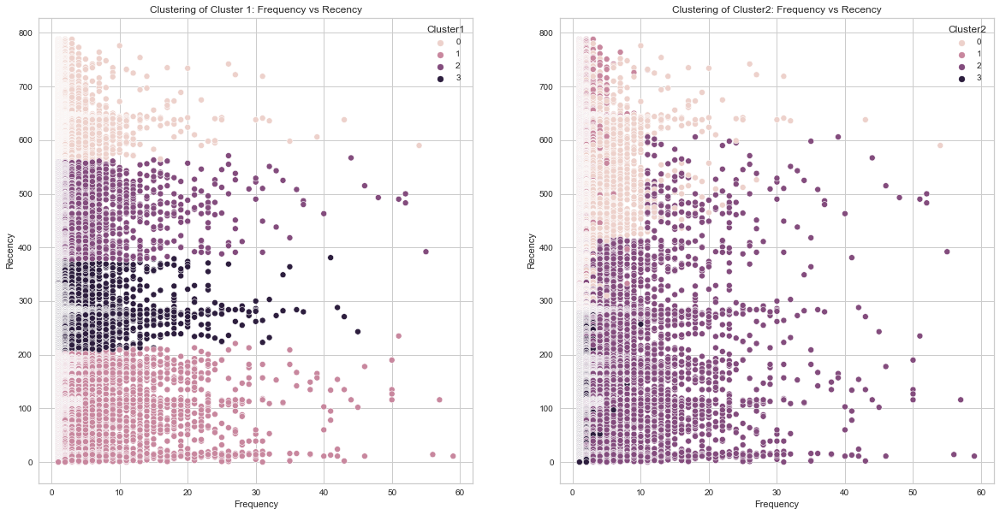

In [31]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)

sns.scatterplot(RFM_res['Frequency'], RFM_res['Recency'], hue=RFM_res['Cluster1'])
plt.title('Clustering of Cluster 1: Frequency vs Recency')


plt.subplot(1,2,2)
sns.scatterplot(RFM_res['Frequency'], RFM_res['Recency'], hue=RFM_res['Cluster2'])
plt.title('Clustering of Cluster2: Frequency vs Recency')

plt.show()

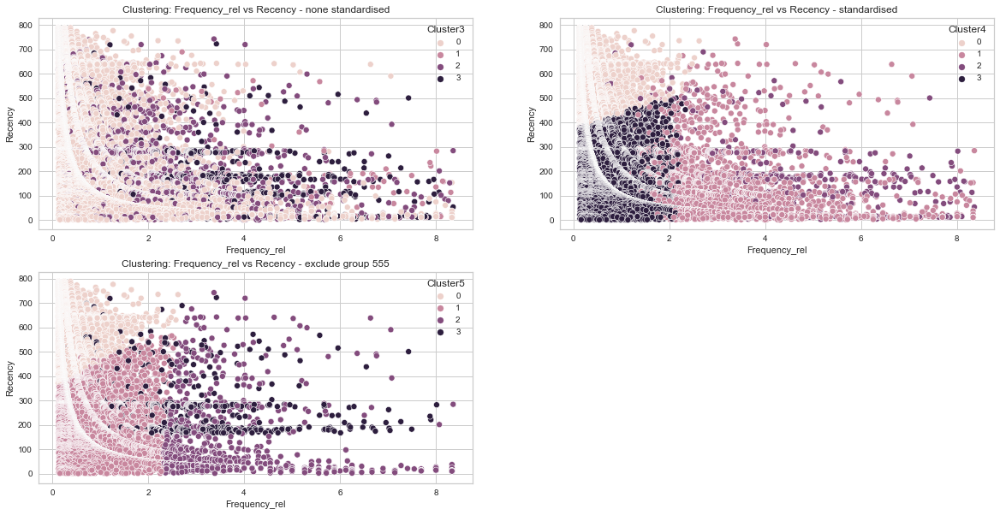

In [32]:
# model 3 & model 4 & model 5
plt.figure(figsize=(20,10))
plt.subplot(221)
sns.scatterplot(RFM_rel_res['Frequency_rel'], RFM_rel_res['Recency'], hue=RFM_rel_res['Cluster3'])
plt.title('Clustering: Frequency_rel vs Recency - none standardised')

plt.subplot(222)
sns.scatterplot(RFM_rel_res['Frequency_rel'], RFM_rel_res['Recency'], hue=RFM_rel_res['Cluster4'])
plt.title('Clustering: Frequency_rel vs Recency - standardised')

plt.subplot(223)
sns.scatterplot(RFM_rel_res5['Frequency_rel'], RFM_rel_res5['Recency'], hue=RFM_rel_res5['Cluster5'])
plt.title('Clustering: Frequency_rel vs Recency - exclude group 555')
plt.show()

**3D representation of segmented customers**

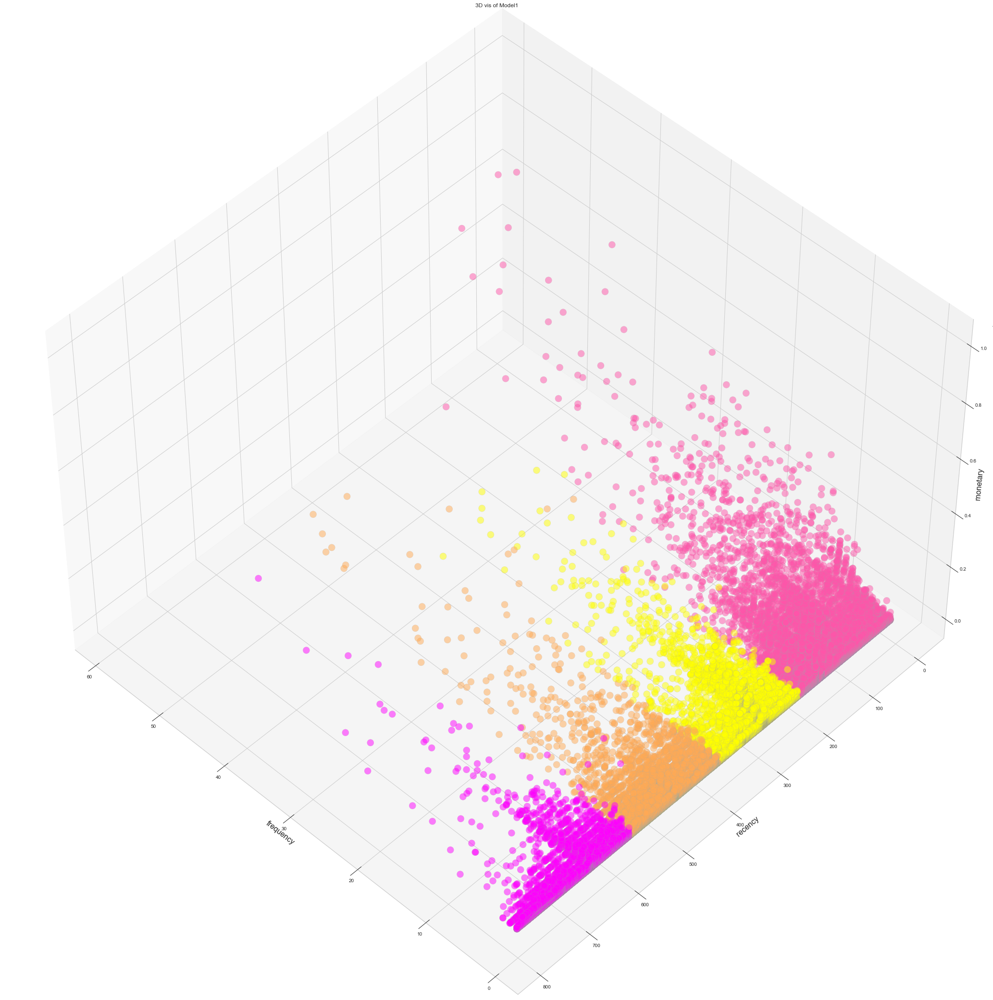

In [33]:
#Plot a 3D model
import mpl_toolkits as mpltk

plt.rcParams['figure.figsize'] = (30,30)
fig = plt.figure(1)
plt.clf()

ax = mpltk.mplot3d.Axes3D(fig, 
            rect = [0,0,.95,1],
            elev = 48,
            azim = 134)
plt.cla()
ax.scatter(RFM_res['Frequency'], RFM_res['Recency'], RFM_res['Monetary'],
           c = RFM_res['Cluster1'],
           s = 200,
           cmap='spring',
           alpha = 0.5,
           edgecolor = 'darkgrey')

ax.set_xlabel('frequency', fontsize=16)
ax.set_ylabel('recency', fontsize=16)
ax.set_zlabel('monetary', fontsize=16)
plt.title('3D vis of Model1')
plt.show()


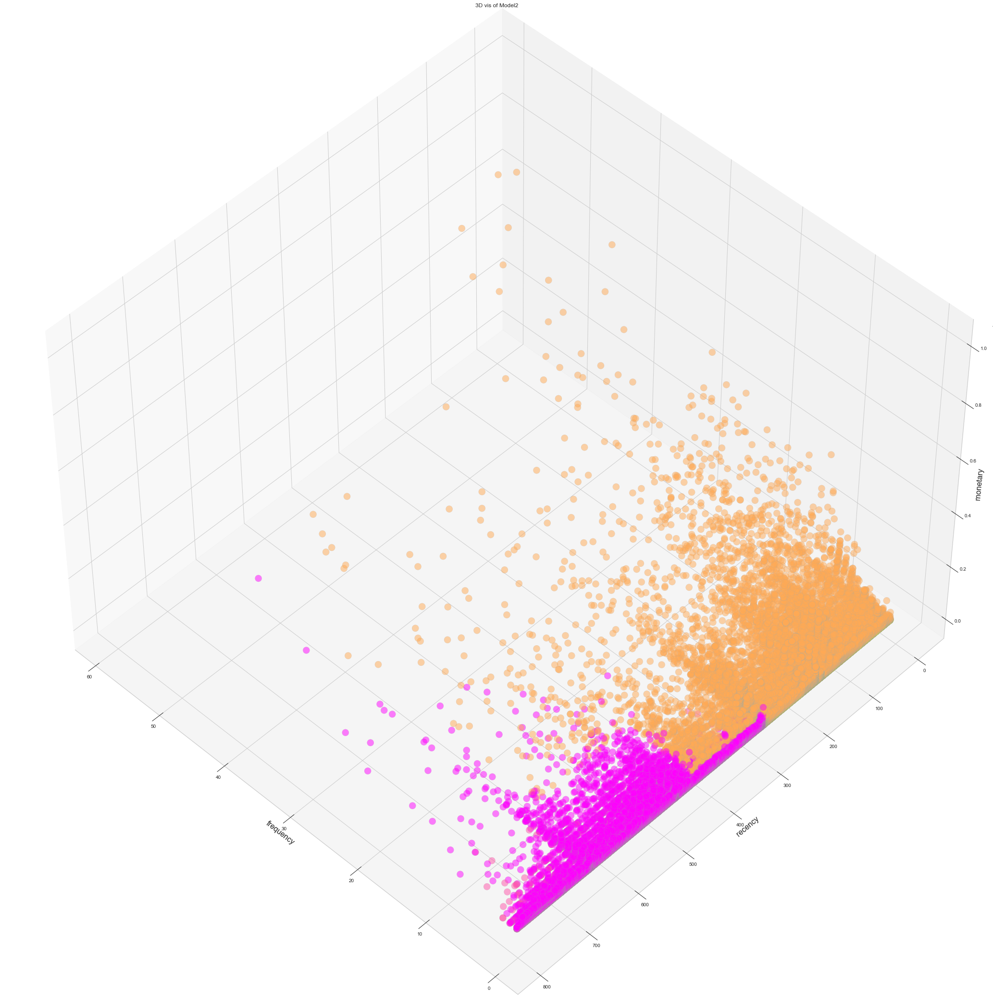

In [36]:
plt.rcParams['figure.figsize'] = (30,30)
fig = plt.figure(1)
plt.clf()

ax = mpltk.mplot3d.Axes3D(fig, 
            rect = [0,0,.95,1],
            elev = 48,
            azim = 134)
plt.cla()
ax.scatter(RFM_res['Frequency'], RFM_res['Recency'], RFM_res['Monetary'],
           c = RFM_res['Cluster2'],
           s = 200,
           cmap='spring',
           alpha = 0.5,
           edgecolor = 'darkgrey')

ax.set_xlabel('frequency', fontsize=16)
ax.set_ylabel('recency', fontsize=16)
ax.set_zlabel('monetary', fontsize=16)
plt.title('3D vis of Model2')
plt.show()

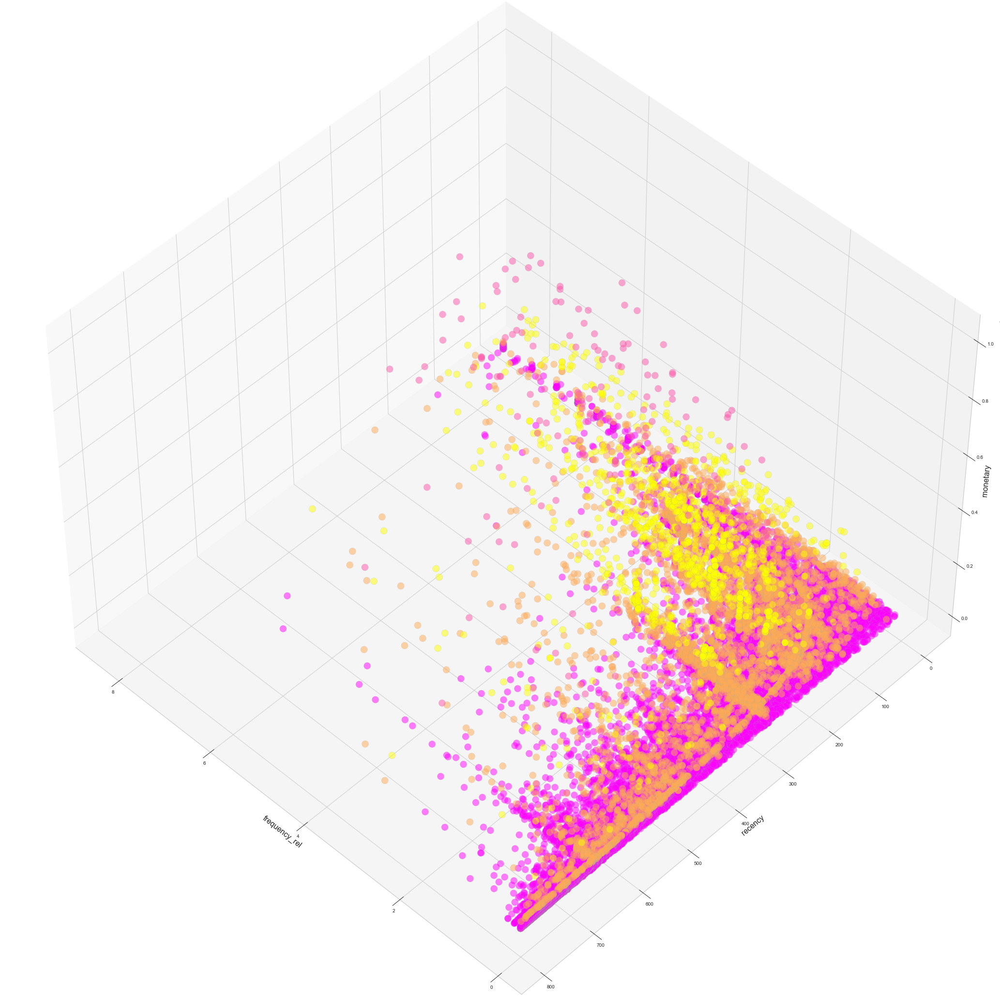

In [34]:
#Plot a 3D model for model 3
import mpl_toolkits as mpltk

plt.rcParams['figure.figsize'] = (30,30)
fig = plt.figure(1)
plt.clf()

ax = mpltk.mplot3d.Axes3D(fig, 
            rect = [0,0,.95,1],
            elev = 48,
            azim = 134)
plt.cla()
ax.scatter(RFM_rel_res['Frequency_rel'], RFM_rel_res['Recency'], RFM_rel_res['Monetary'],
           c = RFM_rel_res['Cluster3'],
           s = 200,
           cmap='spring',
           alpha = 0.5,
           edgecolor = 'darkgrey')

ax.set_xlabel('frequency_rel', fontsize=16)
ax.set_ylabel('recency', fontsize=16)
ax.set_zlabel('monetary', fontsize=16)
plt.show()

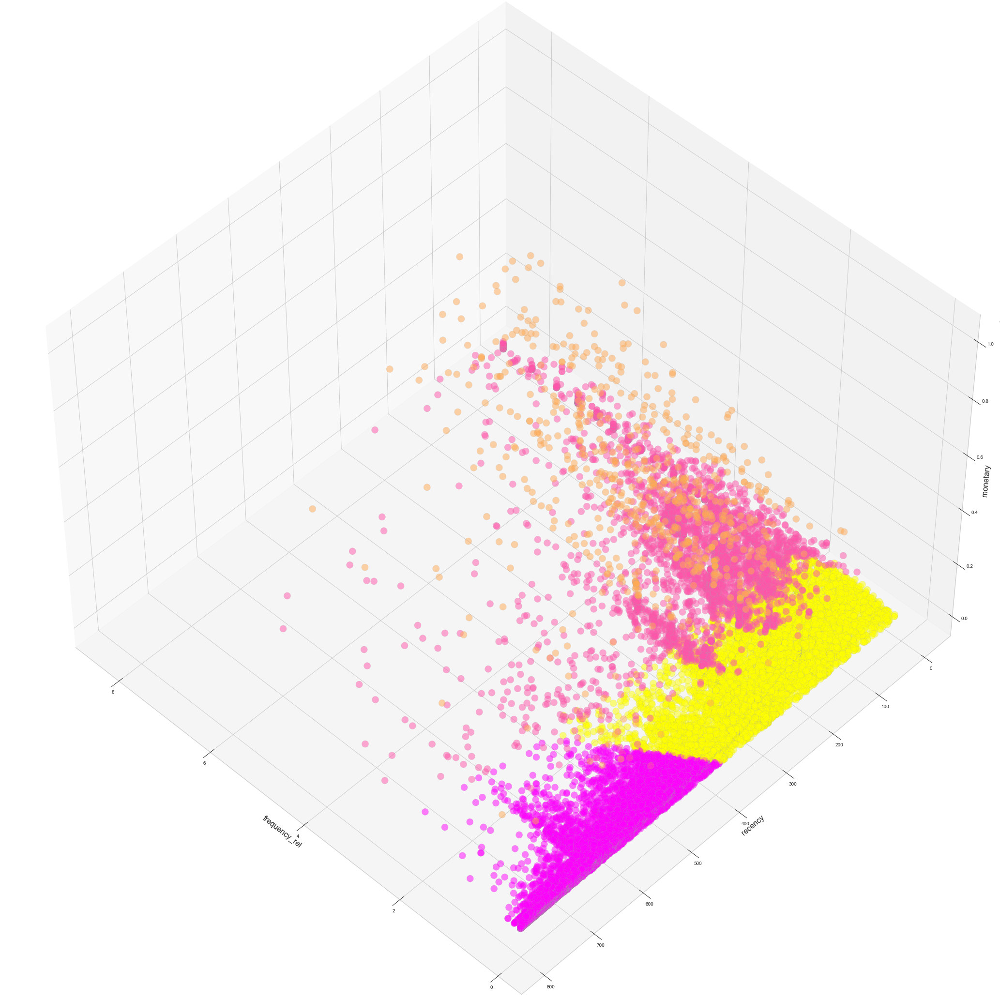

In [37]:
#Plot a 3D model for model 4
import mpl_toolkits as mpltk

plt.rcParams['figure.figsize'] = (30,30)
fig = plt.figure(1)
plt.clf()

ax = mpltk.mplot3d.Axes3D(fig, 
            rect = [0,0,.95,1],
            elev = 48,
            azim = 134)
plt.cla()
ax.scatter(RFM_rel_res['Frequency_rel'], RFM_rel_res['Recency'], RFM_rel_res['Monetary'],
           c = RFM_rel_res['Cluster4'],
           s = 200,
           cmap='spring',
           alpha = 0.5,
           edgecolor = 'darkgrey')

ax.set_xlabel('frequency_rel', fontsize=16)
ax.set_ylabel('recency', fontsize=16)
ax.set_zlabel('monetary', fontsize=16)
plt.show()

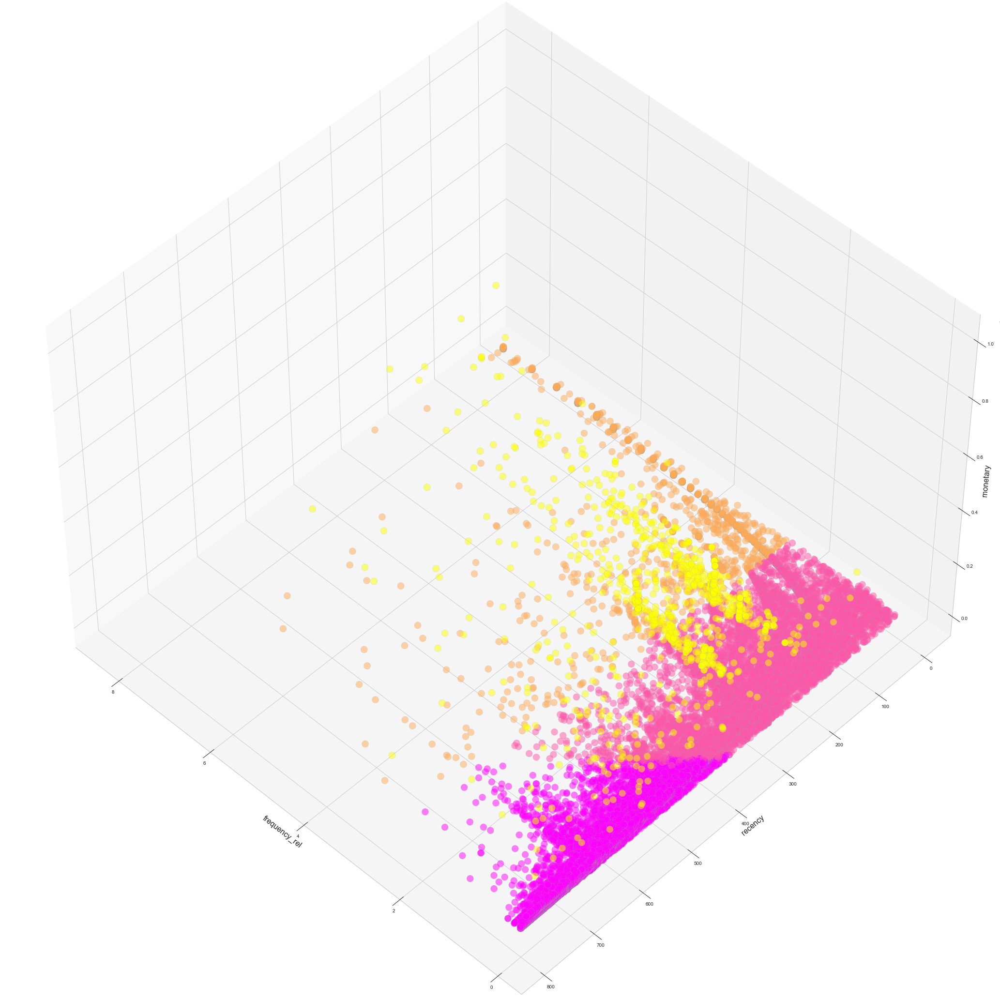

In [35]:
#Plot a 3D model for model 5
import mpl_toolkits as mpltk

plt.rcParams['figure.figsize'] = (30,30)
fig = plt.figure(1)
plt.clf()

ax = mpltk.mplot3d.Axes3D(fig, 
            rect = [0,0,.95,1],
            elev = 48,
            azim = 134)
plt.cla()
ax.scatter(RFM_rel_res5['Frequency_rel'], RFM_rel_res5['Recency'], RFM_rel_res5['Monetary'],
           c = RFM_rel_res5['Cluster5'],
           s = 200,
           cmap='spring',
           alpha = 0.5,
           edgecolor = 'darkgrey')

ax.set_xlabel('frequency_rel', fontsize=16)
ax.set_ylabel('recency', fontsize=16)
ax.set_zlabel('monetary', fontsize=16)
plt.show()

## 6. Experimentation

### 6.1 Result analysis

Based on the 5 models / clusters generated above, we can see:
- Cluster 1 is heavily influenced by recency score
- Cluster 3 is heavily influenced by monetary score
- Cluster 4 is heavily influenced by monetary score but also taken into account freqency and recency scores
- Other clusters are mixed

Hence **Cluster 4** (or **model 4**) has the best balance, especially the **group 2** is the best targeting segment given the highest monetary amount, highest shopping frequency and good recency socre (i.e. shopped recently)

In [80]:
data_res = data.merge(right=RFM_rel_res['Cluster4'].reset_index(),on='Customer ID',how='left')
data_res_g2 = data_res[data_res.Cluster4==2]
data_res.head()

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,discount_amount,...,status_new,Customer Since new,discount_rate,grand_item,Most_Recent_Purchase,Recency,Frequency,Monetary,Frequency_rel,Cluster4
0,211131.0,complete,7/1/2016,kreations_YI 06-L,1950.0,1.0,1950.0,100147443,Women's Fashion,0.0,...,completed,201607,0.0,1950.0,2016-07-01,788.0,1,1950.0,0.126743,0.0
1,211139.0,complete,7/1/2016,UK_Namkino Mix Nimco 400 Gms,170.0,1.0,170.0,100147450,Soghaat,0.0,...,completed,201607,0.0,170.0,2016-07-01,788.0,1,170.0,0.126743,0.0
2,211142.0,complete,7/1/2016,"GFC_Pedestal Myga Cross Base (Special Guard) 24""",5500.0,1.0,5500.0,100147453,Appliances,0.0,...,completed,201607,0.0,5500.0,2016-07-01,788.0,1,5500.0,0.126743,0.0
3,211143.0,received,7/1/2016,BK1070200PL,210.0,1.0,366.0,100147454,Soghaat,0.0,...,processing,201607,0.0,210.0,2016-07-01,788.0,1,366.0,0.126743,0.0
4,211144.0,received,7/1/2016,BK1130200CF,156.0,1.0,366.0,100147454,Soghaat,0.0,...,processing,201607,0.0,156.0,2016-07-01,788.0,1,366.0,0.126743,0.0


In [161]:
# average transaction revenue
data_res['YearMonth'] = (data_res.Year*100 + data_res.Month).astype(int).astype(str)
data_res_g2['YearMonth'] = (data_res_g2.Year*100 + data_res_g2.Month).astype(int).astype(str)

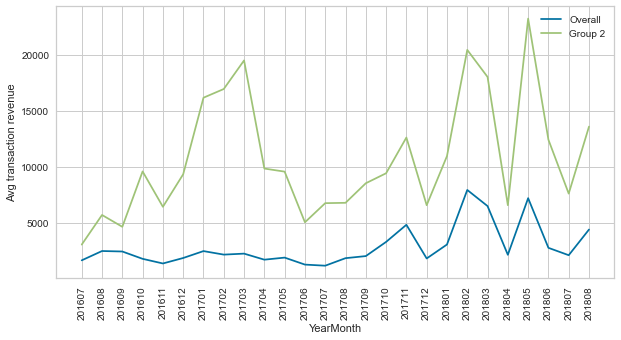

the overall average transaction revenue is 2889
the group 2 average transaction revenue is 10750
the average transaction revenue from group 2 is 310 % higher than the overall


In [172]:
t1=data_res.groupby('YearMonth')['grand_item'].mean()
t2=data_res_g2.groupby('YearMonth')['grand_item'].mean()

plt.figure(figsize=(10,5))
sns.lineplot(data=t1,label='Overall')
sns.lineplot(data=t2,label='Group 2')
plt.ylabel('Avg transaction revenue')
plt.xticks(rotation=90)
plt.legend()
plt.show()

print("the overall average transaction revenue is",int(t1.mean()))
print("the group 2 average transaction revenue is",int(t2.mean()))
print("the average transaction revenue from group 2 is",int((t2/t1-1).mean()*100),"% higher than the overall")

If we target 'group 2' customer, with every one additional 'group 2' type customer, we are expecting to generate extra 7,861 revenue or 1,179 profit (with 15% profit margin) for each transaction.

Hence additional marketomg cost or discount incentive would be worthwhile as long as less than the extra profit it can generate (i.e. 1179 per transaction in this case)

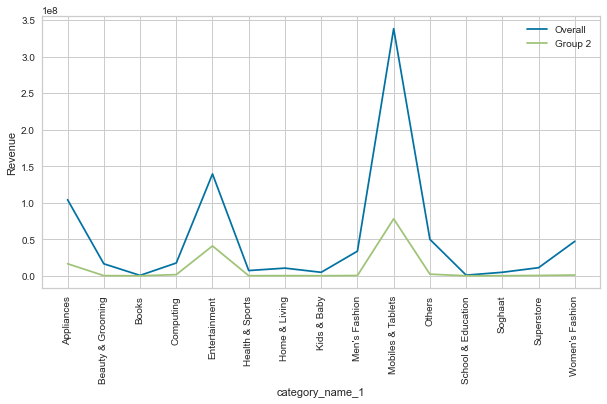

In [196]:
# Best selling category
t3 = data_res.groupby(['category_name_1'])['grand_item'].sum()
t4 = data_res_g2.groupby(['category_name_1'])['grand_item'].sum()

plt.figure(figsize=(10,5))
sns.lineplot(data=t3,label='Overall')
sns.lineplot(data=t4,label='Group 2')
plt.ylabel('Revenue')
plt.xticks(rotation=90)
plt.legend()
plt.show()

Hence the best selling category for targeting is 'Mobiles & Tablets', 'Entertainment' and 'Appliances', especially for group 2

These categories should be targeted in marketing

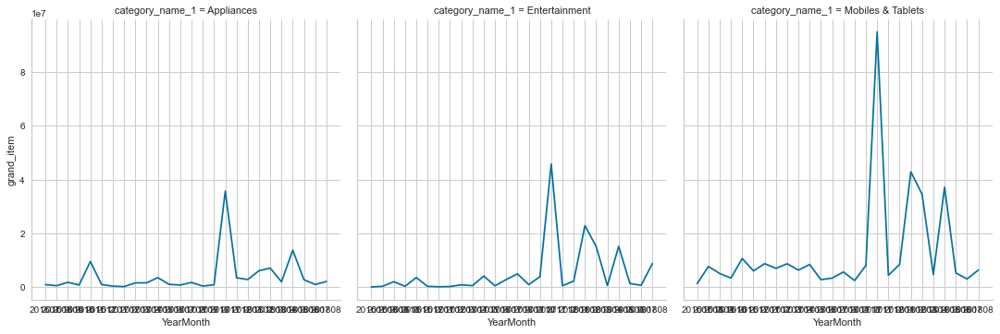

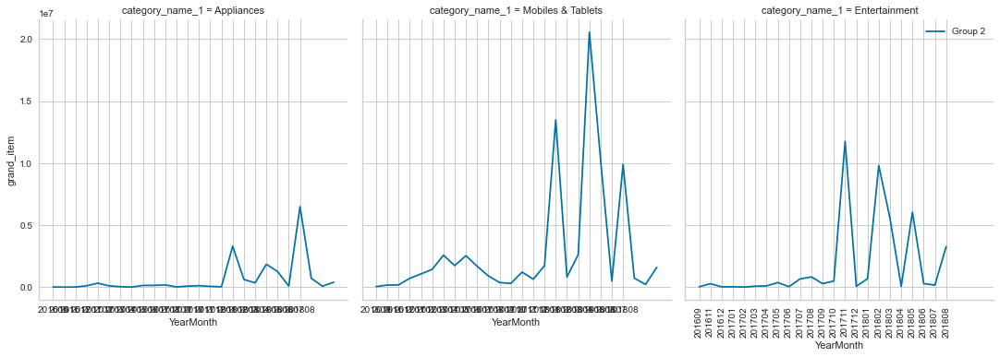

In [208]:
# Best selling category by month
Best_category = (data_res.category_name_1=='Mobiles & Tablets') | (data_res.category_name_1=='Entertainment')|(data_res.category_name_1=='Appliances')
t5 = data_res[Best_category].groupby(['YearMonth','category_name_1'])['grand_item'].sum().reset_index()
t6 = data_res_g2[Best_category].groupby(['YearMonth','category_name_1'])['grand_item'].sum().reset_index()

sns.relplot(x='YearMonth',y='grand_item',data=t5,col='category_name_1',kind='line',label='Overall',col_wrap=3,height=5)
sns.relplot(x='YearMonth',y='grand_item',data=t6,col='category_name_1',kind='line',label='Group 2',col_wrap=3,height=5)
plt.ylabel('Revenue')
plt.xticks(rotation=90)
plt.legend()
plt.show()

# need to fix the xlabel, legend & sort category

No obvious seasonality by category